In [ ]:
# default_exp masks

# Mask visualization

> Visualize defects.

In [ ]:
# hide
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [ ]:
# hide
from nbdev import show_doc

In [ ]:
# export
from steel_segmentation.metadata import *

from fastcore.foundation import *
from PIL import Image
from collections import defaultdict
from matplotlib import pyplot as plt
from fastcore.test import test_eq
from fastai.data.transforms import get_image_files
from fastai.vision.all import Image

import pandas as pd
import numpy as np
from functools import partial
import cv2
from pathlib import Path

In [ ]:
# hide
only_imgs = ["0a1cade03.jpg", "bca4ae758.jpg", "988cf521f.jpg", "b6a257b28.jpg",
             "b2ad335bf.jpg", "72aaba8ad.jpg", "f383950e8.jpg"]
train = train[train["ImageId"].isin(only_imgs)].copy()
train_all = train_all[train_all["ImageId"].isin(only_imgs)].copy()
train_multi = train_multi[train_multi["ImageId"].isin(only_imgs)].copy()

## An example

From an `ImageId` we get the pixel coordinates or the mask for every defect. Here an example of steel image.

            ImageId  ClassId
6757  f383950e8.jpg        3
6758  f383950e8.jpg        4


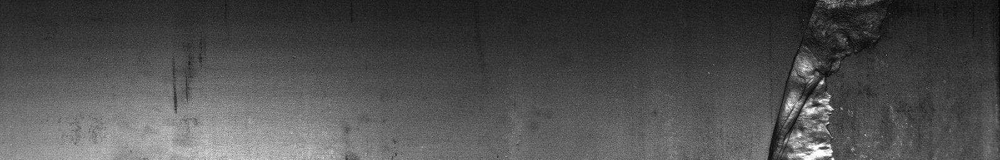

In [ ]:
img_id = "f383950e8.jpg"
tmp_df = train[train['ImageId'] == img_id]
img_path = train_path / img_id
im = Image.open(img_path)

print(tmp_df[["ImageId", "ClassId"]])
im

In [ ]:
height, width = im.shape
height, width

(256, 1600)

In [ ]:
assert height == 256
assert width == 1600

## Picking functions

In [ ]:
# export
def get_random_idx(n: int) -> np.ndarray:
    """
    Return a random sequence of size `n`.
    """
    rng = np.random.default_rng()
    return rng.permutation(n)

In [ ]:
get_random_idx(50)

array([16, 13,  4, 26,  0, 31, 17, 38, 44, 14, 12, 29,  2, 23, 32,  3, 19,
       24, 48, 27, 40, 46, 39,  7, 35, 36, 11, 28, 37,  9, 45,  8,  6, 42,
       34, 22, 20,  1, 49, 33, 25, 47, 41, 18, 15, 30,  5, 43, 21, 10])

In [ ]:
# export
def get_perm_imgs_path(train_pfiles: L, df: pd.DataFrame) -> L:
    """
    Return img Path list of selected df.
    """
    imgId_vals = df["ImageId"].drop_duplicates().values
    path_idx = train_pfiles.argwhere(lambda x: x.name in imgId_vals)
    sel_paths = train_pfiles[path_idx]
    idx = get_random_idx(len(sel_paths))
    return sel_paths[idx]

In [ ]:
get_perm_imgs_path(train_pfiles, train_all)[:5]

(#5) [Path('../data/train_images/6976314b8.jpg'),Path('../data/train_images/35665c5b9.jpg'),Path('../data/train_images/1c8802c08.jpg'),Path('../data/train_images/2f8a16cc3.jpg'),Path('../data/train_images/e998b2a8c.jpg')]

## RLE functions

In [ ]:
# export
def rle2mask(rle: str, value: int, shape):
    """
    From a RLE encoded pixels returns a mask 
    with `value` for defected pixels 
    (e.g. `value`=1 so 1 -> defected, 0 -> groundtruth)
    and `shape` as tuple (height, width).
    """
    assert len(shape) == 2, "The shape must be (height, width)"
    assert isinstance(shape[0], int)
    assert isinstance(shape[1], int)

    h, w = shape
    mask = np.zeros(h * w, dtype=np.uint8)
    
    rle = rle.split(" ")
    positions = map(int, rle[0::2])
    length = map(int, rle[1::2])
    
    for pos, le in zip(positions, length):
        mask[pos:(pos + le)] = value
        
    return mask.reshape(h, w, order='F')

In [ ]:
# export
def make_mask(item, flatten=False, df=None):
    '''
    Given an item as: 
    - row index [int] or 
    - ImageId [str] or
    - file [Path] or 
    - query [pd.Series],
    
    returns the image_item and mask with two types of shapes:
    - (256, 1600) if `flatten`, 
    - (256, 1600, 4) if not `flatten`, 
    
    from the dataframe `train_pivot` if not specified into `df`.
    '''
    if not df: df = train_pivot
    if isinstance(item, str):         cond = df.loc[item]
    elif isinstance(item, int):       cond = df.iloc[item]
    elif isinstance(item, Path):      cond = df.loc[item.name]
    elif isinstance(item, pd.Series): cond = df.loc[item["ImageId"]]
    else:
        print(item, type(item))
        raise KeyError("invalid item")
    
    fname = cond.name
    # without 0 ClassId, only 1,2,3,4 ClassId 
    labels = cond[1:-1]
    
    h, w = (256, 1600)
    masks = np.zeros((h, w, 4), dtype=np.uint8) # 4:class 1～4 (ch:0～3)

    for itemx, label in enumerate(labels.values):
        if label is not np.nan:
            masks[:, :, itemx] = rle2mask(rle=label, value=1, shape=(h,w))
            
    if flatten:
        classes = np.array([1, 2, 3, 4])
        masks = (masks * classes).sum(-1)
            
    return fname, masks

In [ ]:
img_name = "f383950e8.jpg"
row_df = train_multi.loc[train_multi["ImageId"] == img_name].iloc[0]
items = [0, img_name, (train_path / img_name), row_df]

In [ ]:
masks = list(map(make_mask, items))

for imgid, mask in masks:
    test_eq(type(imgid), str)
    test_eq(mask.shape, (256, 1600, 4))

In [ ]:
func = partial(make_mask, flatten=True)
masks = list(map(func, items))

for imgid, mask in masks:
    test_eq(type(imgid), str)
    test_eq(mask.shape, (256, 1600))

In [ ]:
row_df

ClassId
ImageId          f383950e8.jpg
ClassId_multi              3 4
Name: 11963, dtype: object

In [ ]:
_, mask = make_mask(row_df)
_, flatten_mask = make_mask(row_df, flatten=True)

np.unique(mask), np.unique(flatten_mask)

(array([0, 1], dtype=uint8), array([0, 3, 4]))

In [ ]:
# export
def mask2rle(mask):
    '''
    From https://www.kaggle.com/paulorzp/rle-functions-run-lenght-encode-decode

    Attributes: `mask`: numpy array with 1 -> mask, 0 -> background.
    
    Returns: run length as string formated
    '''
    pixels= mask.T.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

In [ ]:
rle = mask2rle(mask)
rle[:100]

'883001 4 883256 11 883512 17 883767 24 884023 30 884278 114 884533 123 884789 131 885044 137 885300 '

## Plot defects

In [ ]:
# export
palet = [
        (249, 192, 12), # ClassId 1
        (0, 185, 241),  # ClassId 2
        (114, 0, 218),  # ClassId 3
        (249,50,12)     # ClassId 4
]

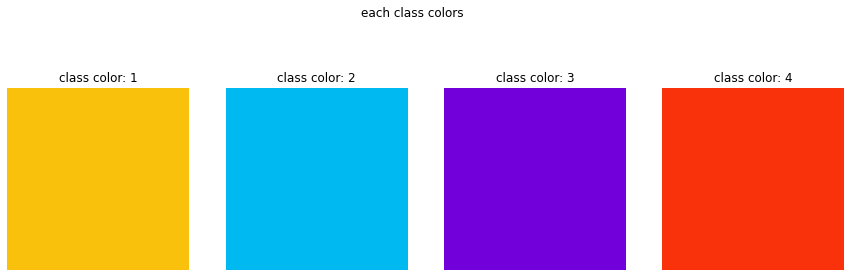

In [ ]:
fig, ax = plt.subplots(1, 4, figsize=(15, 5))
for i in range(4):
    ax[i].axis('off')
    ax[i].imshow(np.ones((50, 50, 3), dtype=np.uint8) * palet[i])
    ax[i].set_title("class color: {}".format(i+1))
fig.suptitle("each class colors")

plt.show()

In [ ]:
# export
def plot_mask_image(name: str, img: np.array, mask: np.array):
    """Plot a np.array image and mask with contours."""
    fig, ax = plt.subplots(figsize=(15, 5))

    for ch in range(4):
        contours, _ = cv2.findContours(mask[:, :, ch], cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)
        for i in range(len(contours)):
            cv2.polylines(img, contours[i], True, palet[ch], 2)
            
    ax.set_title(name, fontsize=13)
    ax.imshow(img)
    plt.xticks([])
    plt.yticks([])
    plt.show()

In [ ]:
img_name = "f383950e8.jpg"
img = cv2.imread(str(train_path/img_name))
_, mask = make_mask(img_name)

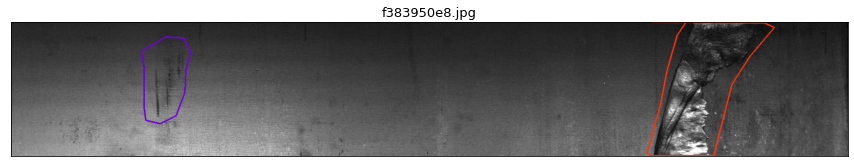

In [ ]:
plot_mask_image(img_name, img, mask)

In [ ]:
# export
def plot_defected_image(img_path: Path):
    """Plot a `img_path` Path image from the training folder with contours."""
    img_name = img_path.name
    img = cv2.imread(str(img_path))
    _, mask = make_mask(img_path)
    plot_mask_image(img_name, img, mask)

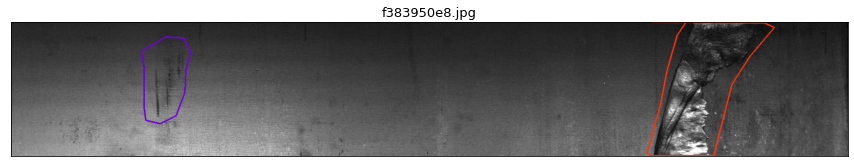

In [ ]:
plot_defected_image(img_path)

## Exploratory defects

In [ ]:
# export
def show_defects(class_id=None, n=20, only_defects=True, multi_defects=False):
    """
    Plot multiple images. 
    Attributes: 
    `class_id`: [str or int] select a type of defect otherwise plot all kinds;
    `n`: select the number of images to plot;
    `only_defects` [bool, default True]: if False it shows even the no faulty images;
    `multi_defects` [bool, default False]: if True it shows imgs with multi defects.
    """
    df = train_multi

    cond_no_defects = df["ClassId_multi"] == '0'
    cond_multi_defects = df["ClassId_multi"].map(lambda x: len(x) > 1)
    cond_classId = df["ClassId_multi"].map(lambda x: str(class_id) in x)

    df = df.loc[cond_no_defects] if not only_defects else df.loc[~cond_no_defects]
    df = df.loc[cond_multi_defects] if multi_defects else df.loc[~cond_multi_defects]
    df = df.loc[cond_classId] if class_id else df

    imgid_from_df = df["ImageId"].tolist()
    pfiles_list = L([train_path / imgid for imgid in imgid_from_df])

    perm_paths = get_perm_imgs_path(pfiles_list, df)
    for img_path in perm_paths[:n]:
        plot_defected_image(img_path)

The `ClassId = 1` identifies single and multiple defects in the form of rounded spots.

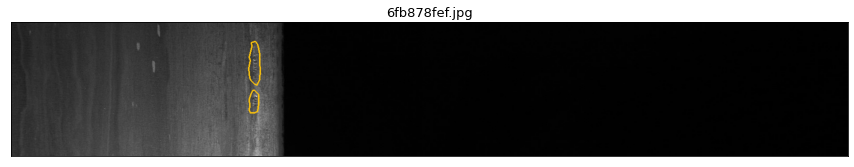

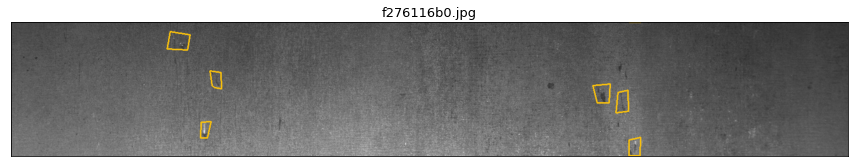

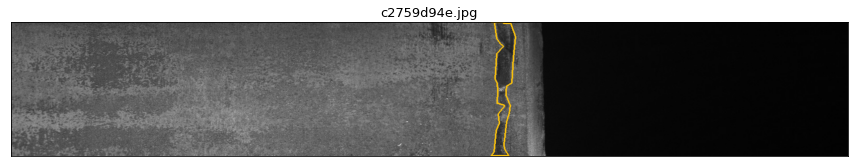

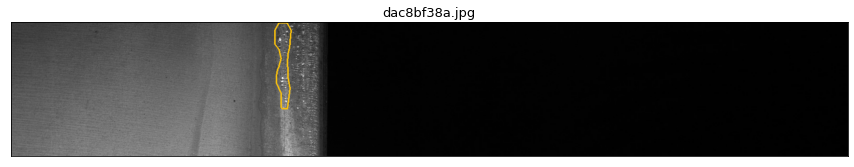

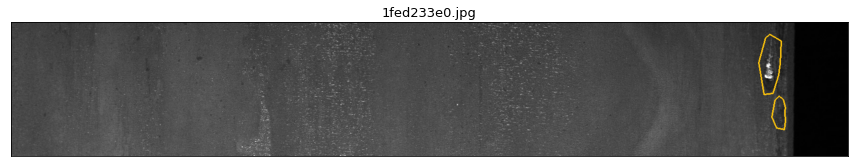

...

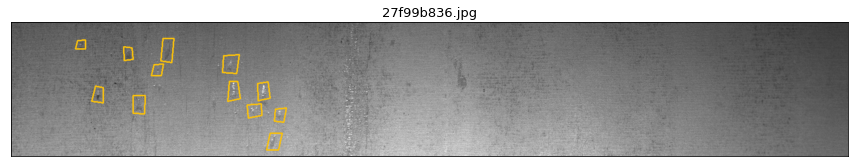

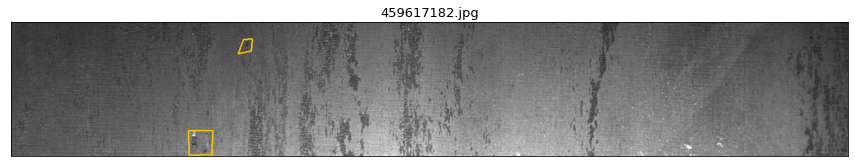

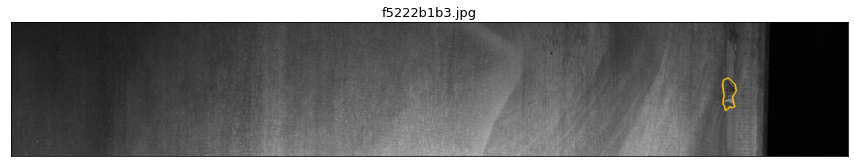

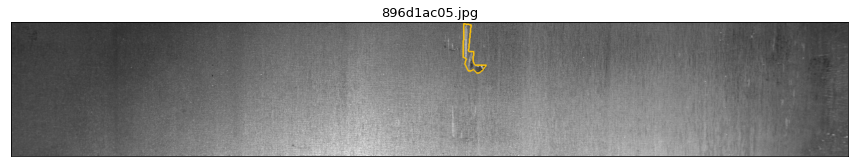

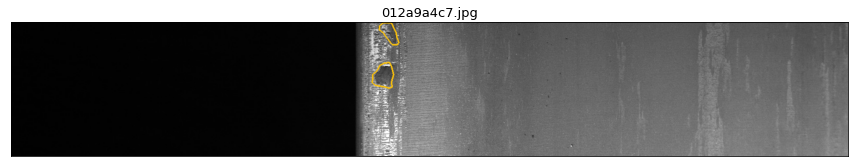

In [ ]:
show_defects(class_id=1, n=20)

The `ClassId = 2` identifies single and multiple defects of grooves.

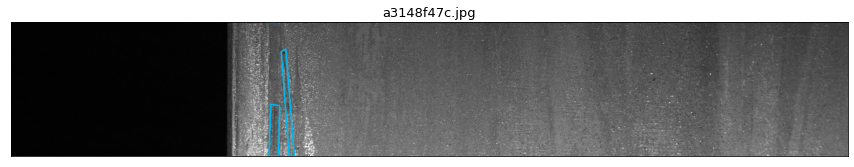

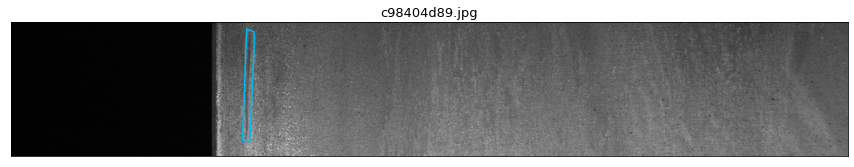

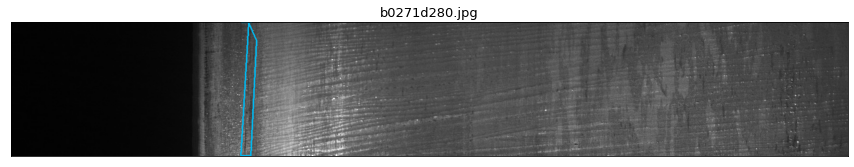

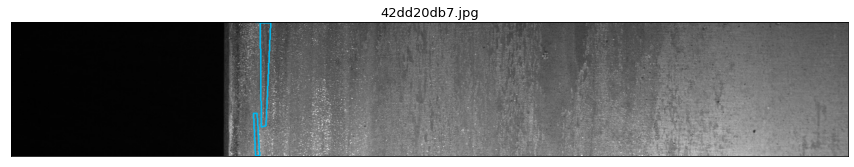

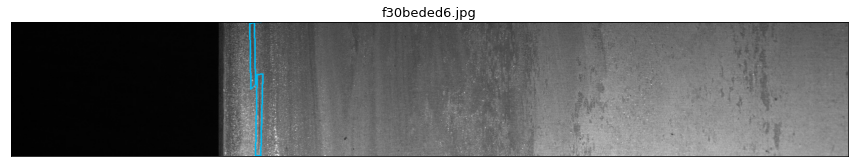

...

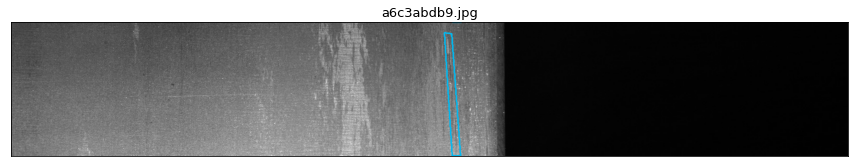

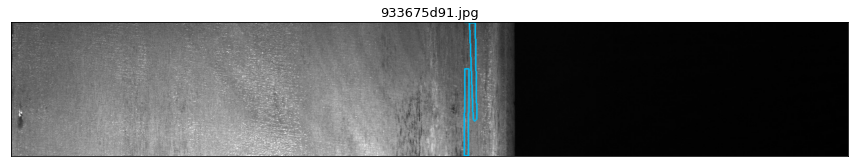

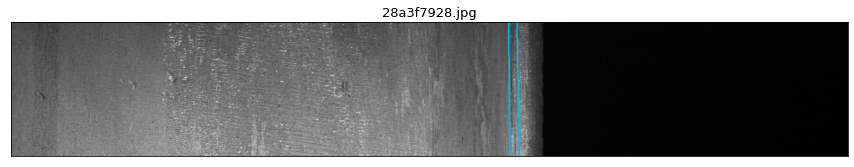

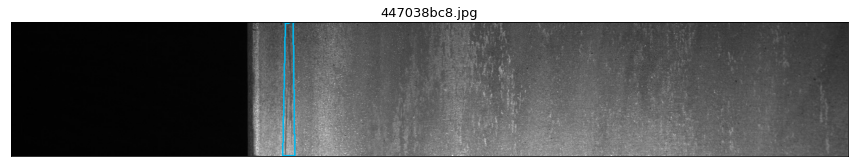

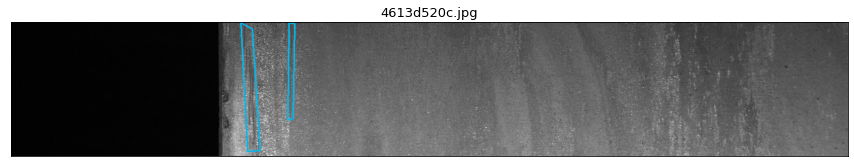

In [ ]:
show_defects(class_id=2, n=20)

The `ClassId = 3` identifies single and multiple defects of scratches.

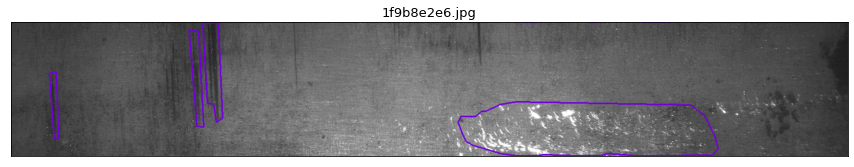

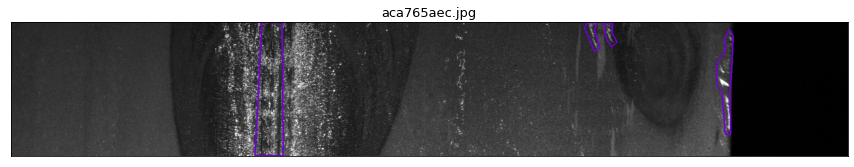

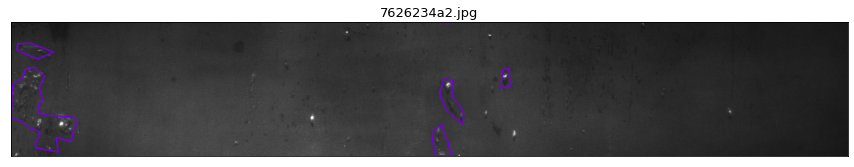

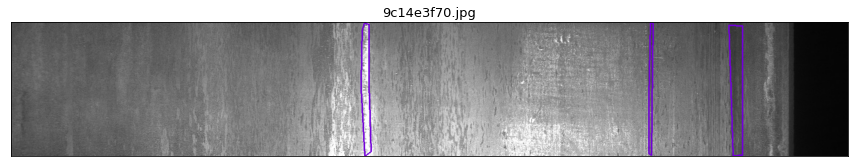

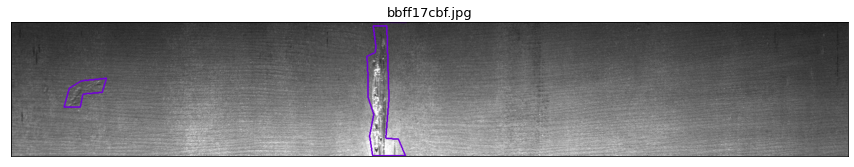

...

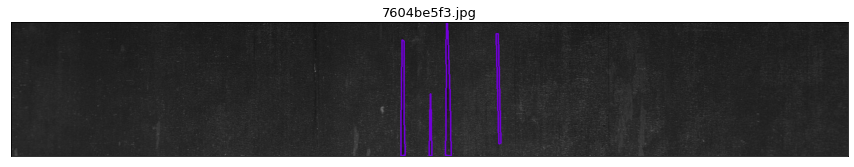

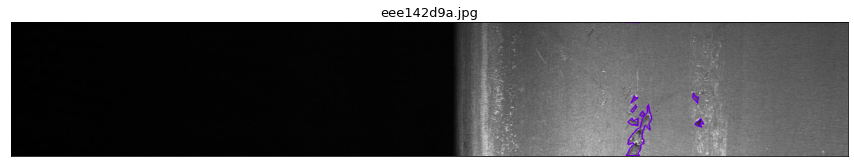

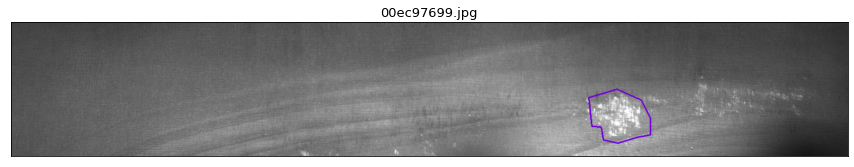

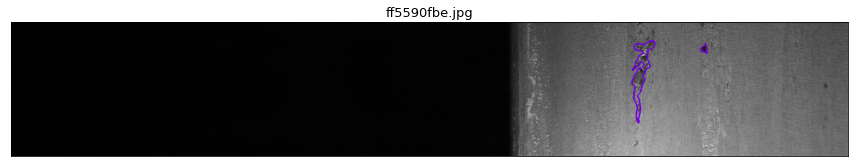

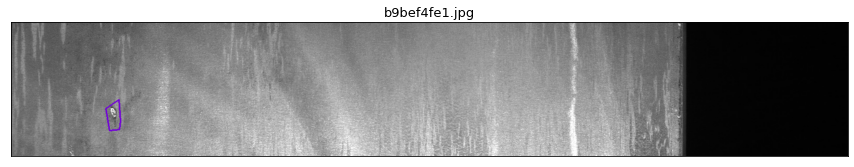

In [ ]:
show_defects(class_id=3, n=20)

The `ClassId = 4` identifies single and multiple defects of rolling process.

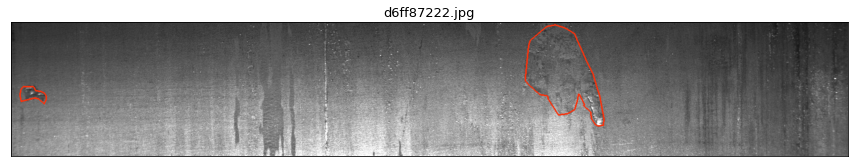

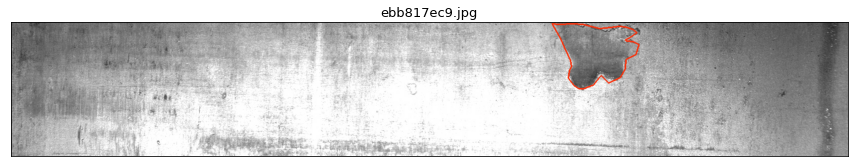

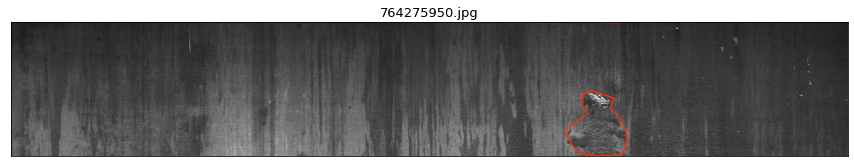

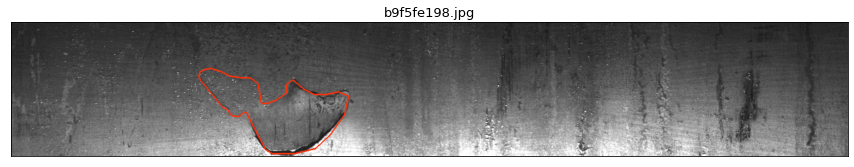

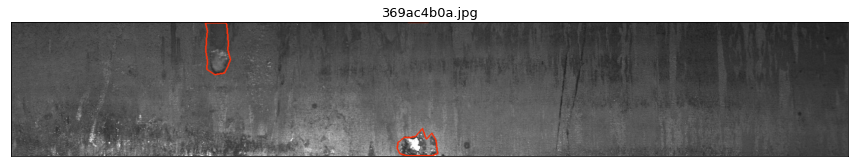

...

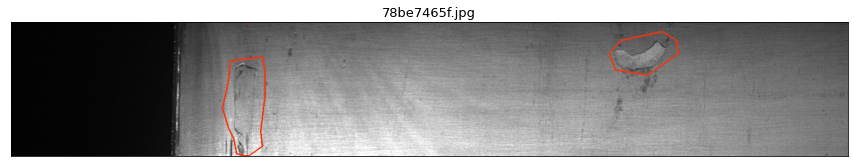

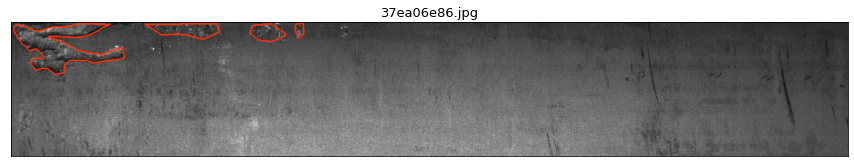

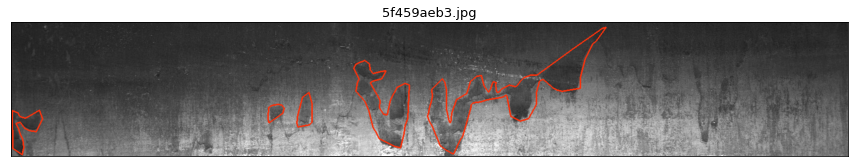

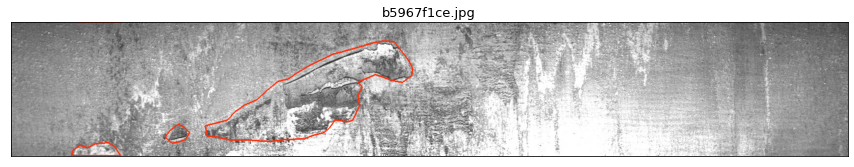

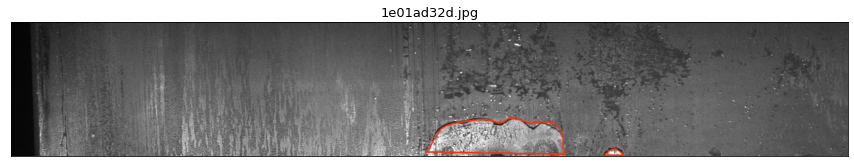

In [ ]:
show_defects(class_id=4, n=20)

To select images with more than one defect:

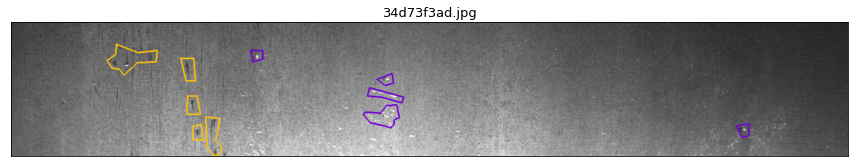

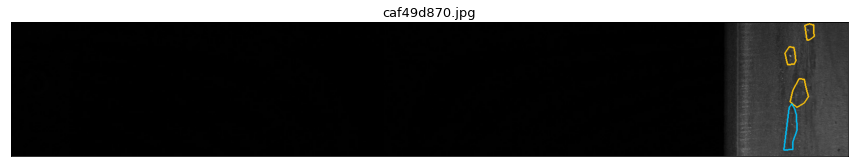

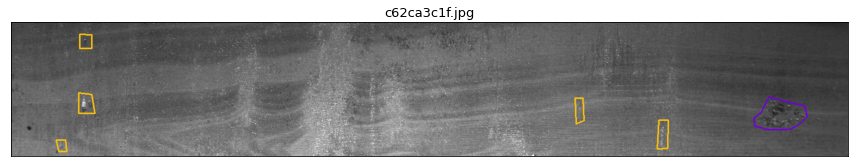

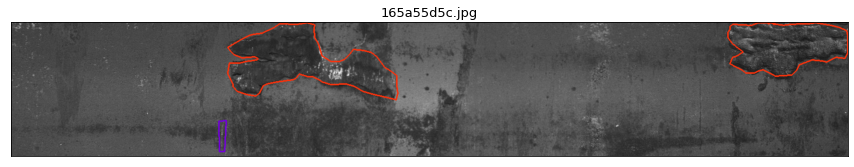

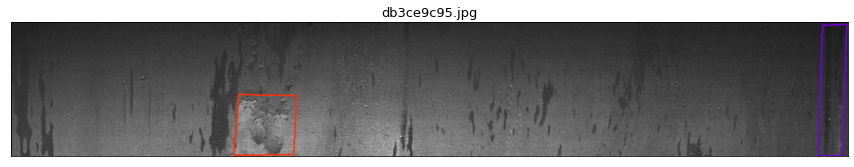

...

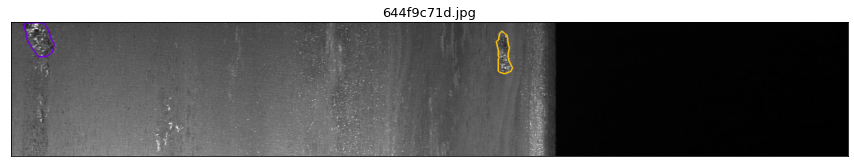

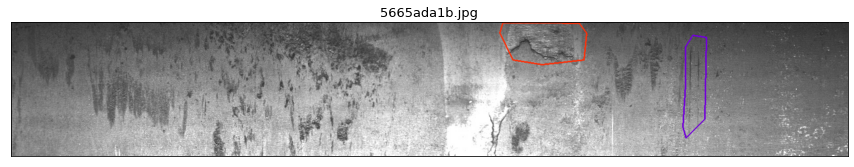

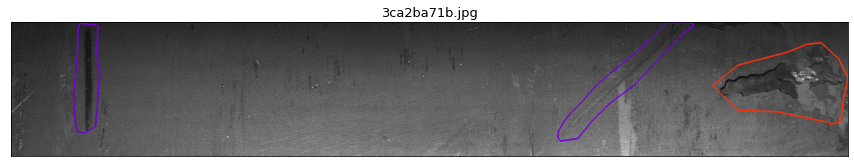

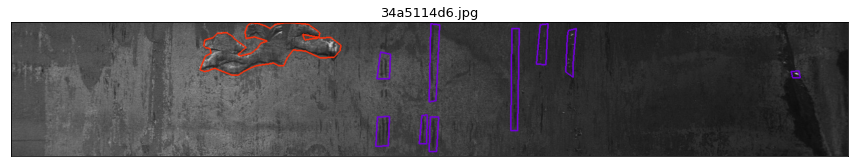

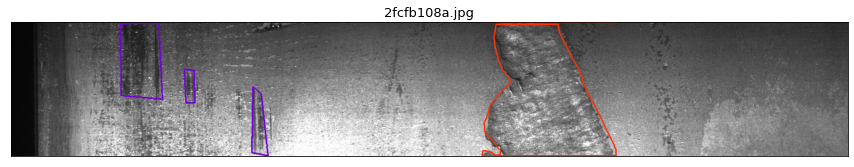

In [ ]:
show_defects(n=20, multi_defects=True)

## Labels

To build masks for a segmentation model I followed two approaches: 

1) As a first approach, I create the masks for all the images in the training folder. The masks are created with `multi_rle_to_mask` so with a `Shape(256, 1600)` and are saved in `labels_path`. This is useful to plot multi class masks and train with fast.ai DataLoaders.

2) Another approach is to create masks only with defect images and keep a `Shape(256, 1600, 4)`. This is useful to pure Pytorch trainers.

NB: masks must be PNG files and not JPEG because JPEG's compression makes the labels get messed up occasionally ([source](https://forums.fast.ai/t/unet-learner-failing-with-a-cuda-device-assert/66747/4)).

In [ ]:
# export
labels_path = path / "labels"

def create_masks(df: pd.DataFrame):
    """Create the masks for ImageId in df"""
    paths = []
    for img_id in df["ImageId"].tolist():
        img_path = train_path / img_id
        img_label = labels_path/f"{img_path.stem}_P.png"
        if not img_label.is_file():
            _, mask = make_mask(img_path)
            im = Image.fromarray(mask)
            im.save(img_label)
        paths.append(img_label)
    return L(paths)

In [ ]:
masks = create_masks(train_multi)

In [ ]:
# missing
ntraining = get_image_files(train_path)
test_eq(len(ntraining), len(masks))

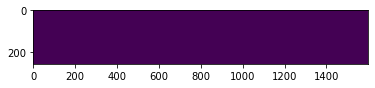

In [ ]:
# missing
idx = get_random_idx(len(masks))
im = np.array(Image.open(masks[idx[0]]))
plt.imshow(im)

In [ ]:
classes=[0,1,2,3,4]
class_ids = np.unique(im).tolist()
check = [c in classes for c in class_ids]
assert False not in check

In [ ]:
# hide
from nbdev.export import notebook2script
notebook2script()

Converted 01_core.ipynb.
Converted 02_data.ipynb.
Converted 03_models.dataloaders.ipynb.
Converted 04_models.metrics.ipynb.
Converted 06_models.model.ipynb.
Converted 07_models.predict.ipynb.
Converted index.ipynb.
